In [2]:
%pylab inline
import numpy as np
import scipy.ndimage as ndi

Populating the interactive namespace from numpy and matplotlib


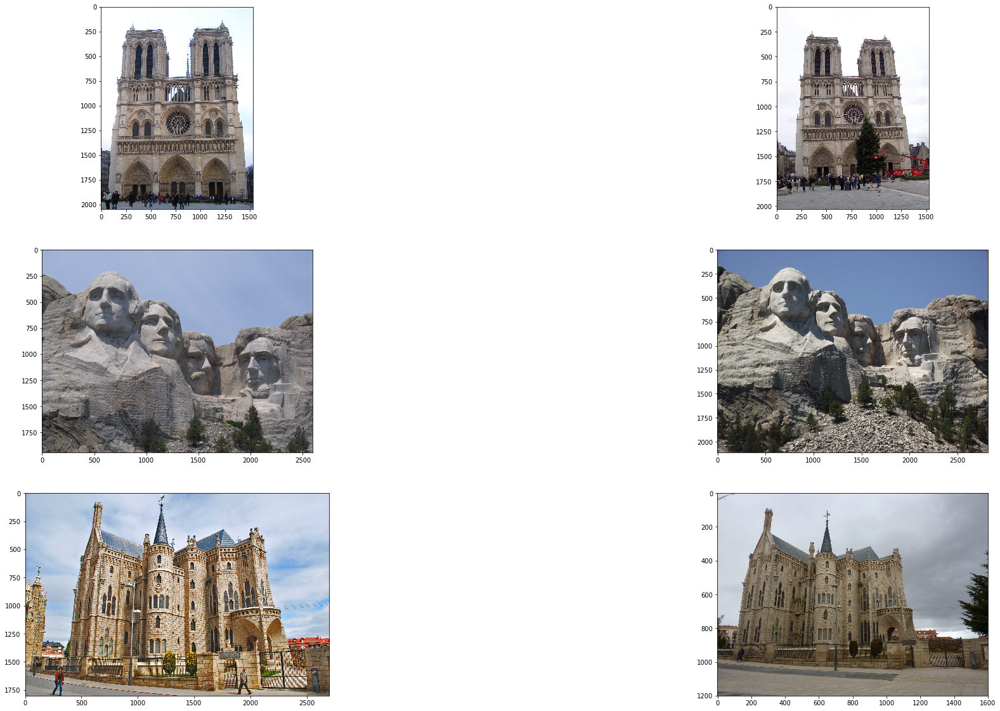

In [3]:
NotreDame = {
    'Im1': imread('data/Notre Dame/1_o.jpg'),
    'Im2': imread('data/Notre Dame/2_o.jpg')
}

MountRushmore = {
    'Im1': imread('data/Mount Rushmore/9021235130_7c2acd9554_o.jpg'),
    'Im2': imread('data/Mount Rushmore/9318872612_a255c874fb_o.jpg')
}

EpiscopalGaudi = {
    'Im1': imread('data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg'),
    'Im2': imread('data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg')
}

plt = figure(figsize=(35, 20))
nd_ax1 = plt.add_subplot(3, 2, 1)
nd_ax2 = plt.add_subplot(3, 2, 2)
nd_ax1.imshow(NotreDame['Im1'])
nd_ax2.imshow(NotreDame['Im2'])
mr_ax1 = plt.add_subplot(3, 2, 3)
mr_ax2 = plt.add_subplot(3, 2, 4)
mr_ax1.imshow(MountRushmore['Im1'])
mr_ax2.imshow(MountRushmore['Im2'])
eg_ax1 = plt.add_subplot(3, 2, 5)
eg_ax2 = plt.add_subplot(3, 2, 6)
eg_ax1.imshow(EpiscopalGaudi['Im1'])
eg_ax2.imshow(EpiscopalGaudi['Im2'])

In [4]:
def Grayscale(Image):
    if Image.ndim == 2:
        return Image
    
    GSImage = np.sum(Image, axis=2)
    GSImage /= Image.shape[2]
    
    return GSImage

def GaussianDerivative(Sigma, EdgeMode='reflect'):
    def Calculate(Image):
        if Image.ndim == 3:
            Image = Grayscale(Image)

        Yderivative = ndi.gaussian_filter1d(Image, Sigma, 0, 1, mode=EdgeMode)
        Xderivative = ndi.gaussian_filter1d(Image, Sigma, 1, 1, mode=EdgeMode)

        return Yderivative, Xderivative
    
    return Calculate

def GaussianWindow(Sigma, EdgeMode='reflect'):
    def Calculate(Image):
        return ndi.gaussian_filter(Image, Sigma, mode=EdgeMode)    

    return Calculate

def SquareWindow(Size, EdgeMode='reflect'):
    def Calculate(Image):
        return (1.0 / (Size * Size)) * ndi.convolve(Image, np.ones((Size, Size)), mode=EdgeMode)
    
    return Calculate

In [5]:
def HarrisCornersResponse(Image, DerivativeFn, WindowFn):
    Image = Grayscale(Image)
    Iy, Ix = DerivativeFn(Image.astype(np.float) / 255.0)
    alpha = 0.04
    
    IxIx = Ix * Ix
    IxIy = Ix * Iy
    IyIy = Iy * Iy
    
    fig = figure(figsize=(35, 20))
    ax1, ax2, ax3 = fig.subplots(1, 3)
    ax1.imshow(IxIx)
    ax2.imshow(IxIy)
    ax3.imshow(IyIy)
    
    IxIxC = WindowFn(IxIx)
    IxIyC = WindowFn(IxIy)
    IyIyC = WindowFn(IyIy)
    
    fig2 = figure(figsize=(35, 20))
    ax21, ax22, ax23 = fig2.subplots(1, 3)
    ax21.imshow(IxIxC)
    ax22.imshow(IxIyC)
    ax23.imshow(IyIyC)
    
    HarrisScore = np.copy(IxIxC)
    HarrisScore *= IyIyC
    HarrisScore -= (IxIyC * IxIyC)
    HarrisScore = np.absolute(HarrisScore)    
    
    fig3 = figure(figsize=(35, 20))
    ax33 = fig3.subplots(1, 1)
    ax33.imshow(HarrisScore)
    
    return HarrisScore

def HarrisCornersLocalMaximaPoints(HarrisScore, WindowSize = 3, Threshold = 0.99, EdgeMode='reflect'):
    MaximumFiltered = ndi.maximum_filter(HarrisScore, (WindowSize, WindowSize), mode=EdgeMode)
    
    fig = figure(figsize=(35, 20))
    ax1 = fig.subplots(1, 1)
    
    Vals = MaximumFiltered
    ValsMax = np.amax(Vals)
    ValsMin = np.amin(Vals)
    
    ax1.imshow(Vals)
        
    return np.argwhere(Vals > Vals.max() * Threshold)

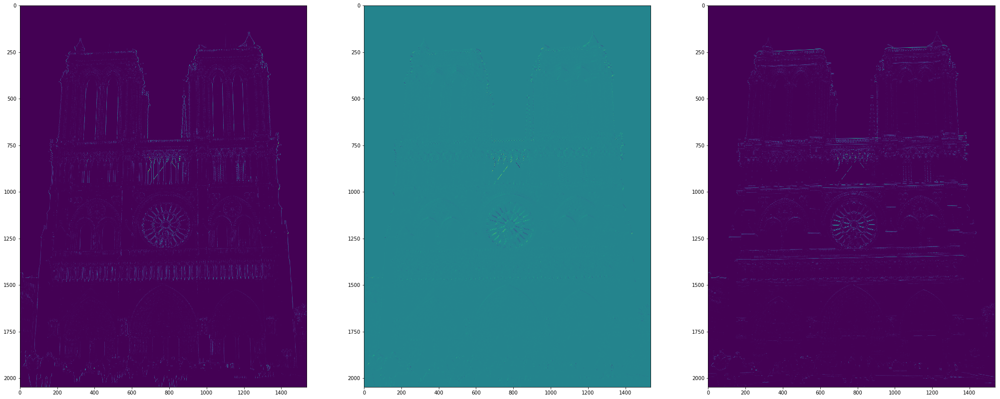

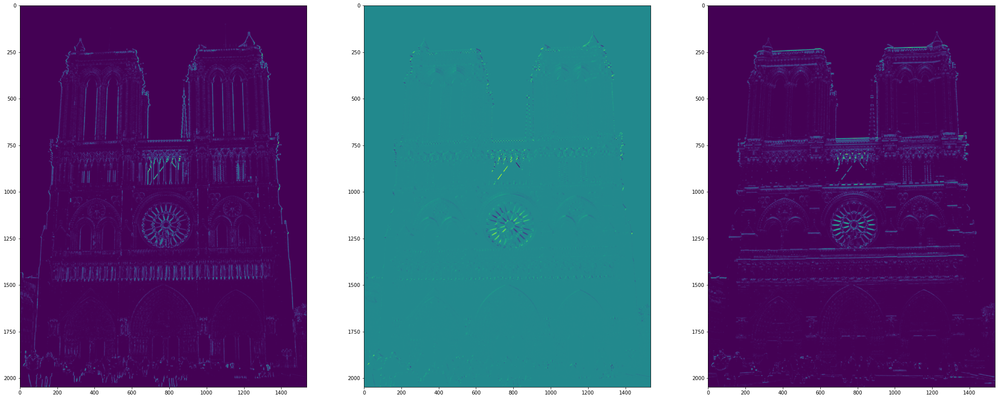

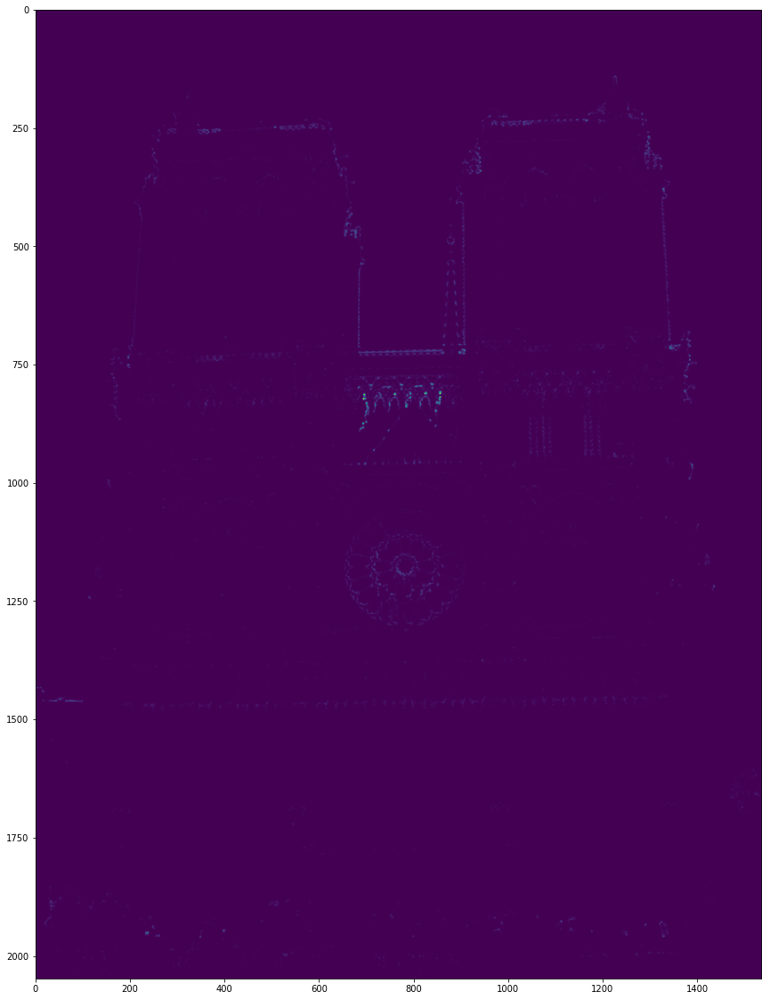

In [6]:
CornerResponse = HarrisCornersResponse(NotreDame['Im1'], GaussianDerivative(1.0), GaussianWindow(1.4))

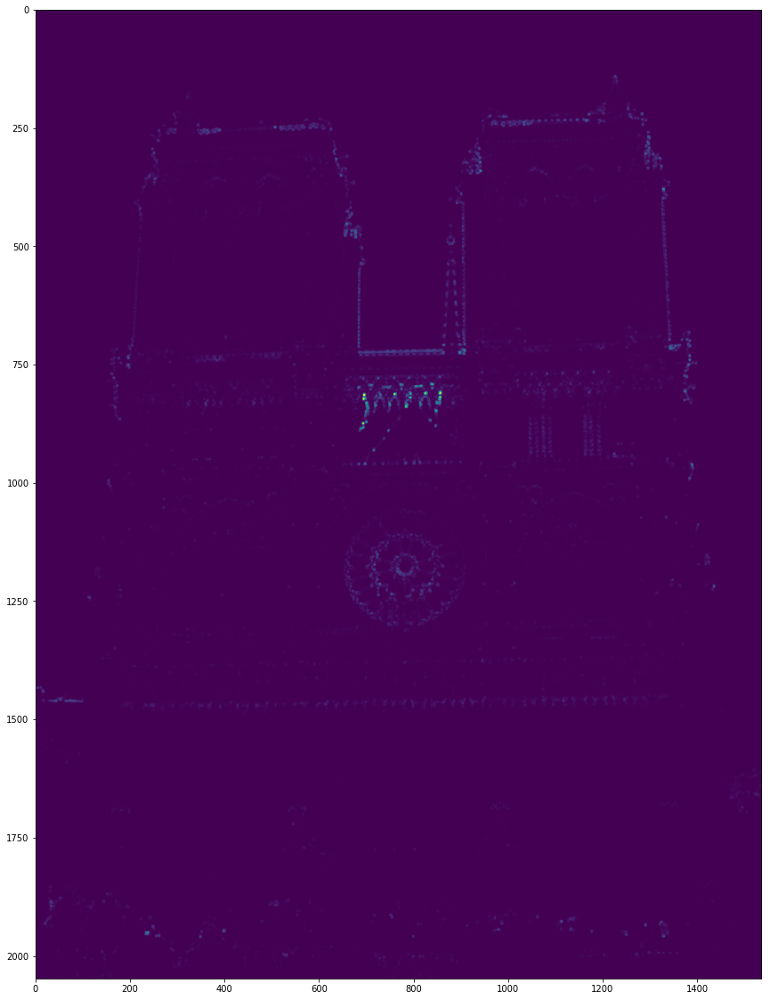

In [7]:
CornerPts = HarrisCornersLocalMaximaPoints(CornerResponse, 3, 0.01)

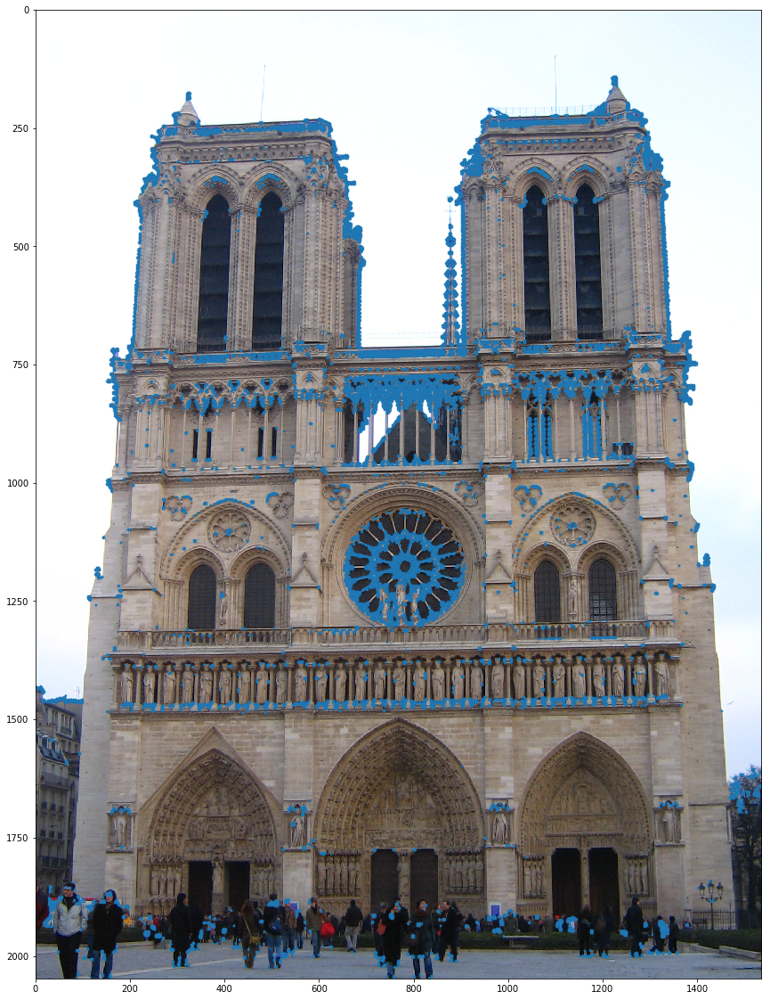

In [8]:
fig = figure(figsize=(35, 20))
ax = fig.subplots(1, 1)

ax.imshow(NotreDame['Im1'])
ax.scatter(CornerPts[:, 1], CornerPts[:, 0], s=0.1)

In [16]:
import sklearn.neighbors as neigh
import kdtree

def ANMS(Responses, Points, N):
    Stacked = np.vstack((
        Points.T,
        Responses[CornerPts[:, 0], CornerPts[:, 1]][:, np.newaxis].T
    )).T
    
    SortedStacked = np.flip(Stacked[np.argsort(Responses[CornerPts[:, 0], CornerPts[:, 1]])], 0)
    Rad = [np.finfo(SortedStacked.dtype).max]
    
    tree = kdtree.create(dimensions=2)
    tree.add(SortedStacked[0, :2])

    s = 8
    for i in range(1, SortedStacked.shape[0]):
        nn = tree.search_nn((SortedStacked[i, :2]))[0].data
        tree.add(SortedStacked[i, :2])
        Rad.append((nn[0] - SortedStacked[i, 0]) ** 2 + (nn[1] - SortedStacked[i, 1]) ** 2)
        if i == s:
            tree = tree.rebalance()
            s *= 2
        
    Num = min(len(Rad), N)
    Partitions = np.argpartition(-np.asarray(Rad), Num)[:Num]
    return SortedStacked[Partitions]
    
def HarrisCornersAdaptiveNonmaximalSuppression(HarrisResponse, CornerPts, Num):
    Radiuses = []
    Responses = HarrisResponse[CornerPts[:, 0], CornerPts[:, 1]]
    ResponseMax = np.amax(HarrisResponse)
    
    for (i, (y, x)) in enumerate(CornerPts):
        BiggerNeighIndexes = np.nonzero(Responses > Responses[i])
        BiggerNeighs = CornerPts[BiggerNeighIndexes]
        
        if BiggerNeighs.shape[0] == 0:
            Radius = 1000000000
        else:
            BiggerNeighs -= np.array([y, x])
            Radius = BiggerNeighs ** 2
            Radius = np.sum(Radius, 1)
            Radius = np.amin(Radius)
        Radiuses.append(Radius)
    
    Num = min(len(Radiuses), Num)
    Partitions = np.argpartition(-np.asarray(Radiuses), Num)[:Num]
    return CornerPts[Partitions]

# ANMSCornerPts = HarrisCornersAdaptiveNonmaximalSuppression(CornerResponse, CornerPts, 100)

CPU times: user 6min 28s, sys: 251 ms, total: 6min 28s
Wall time: 6min 29s


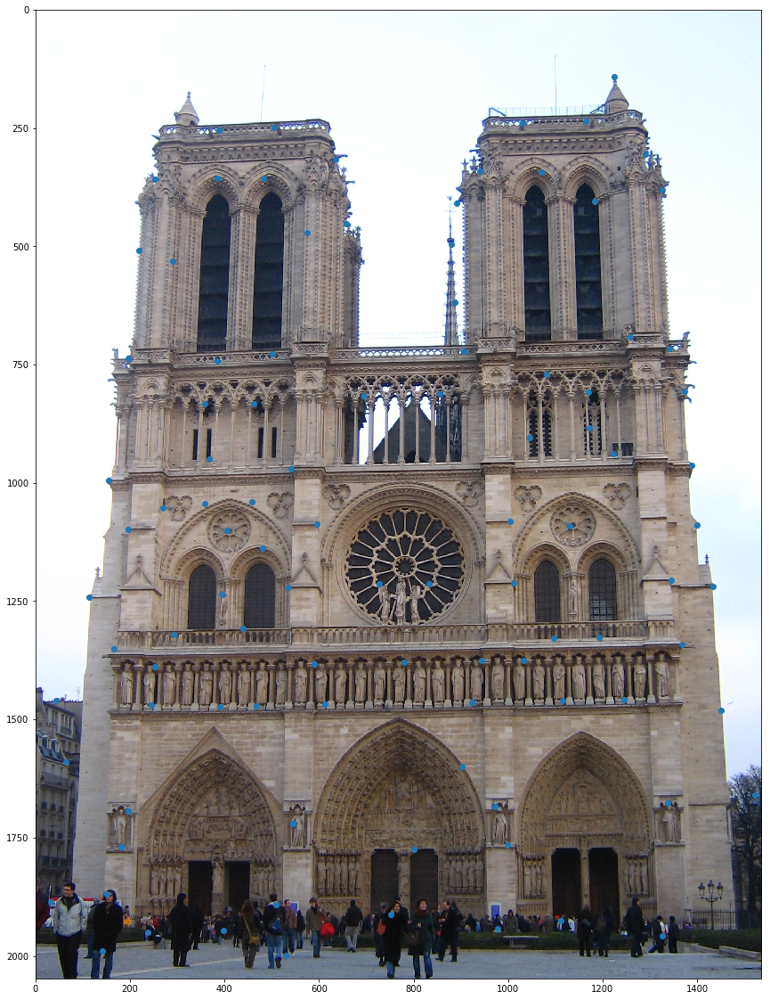

In [18]:
NaivePts = %time HarrisCornersAdaptiveNonmaximalSuppression(CornerResponse, CornerPts, 100) 
fig = figure(figsize=(35, 20))
ax = fig.subplots(1, 1)

ax.imshow(NotreDame['Im1'])
ax.scatter(NaivePts[:, 1], NaivePts[:, 0])

CPU times: user 28.8 s, sys: 216 ms, total: 29.1 s
Wall time: 29.1 s


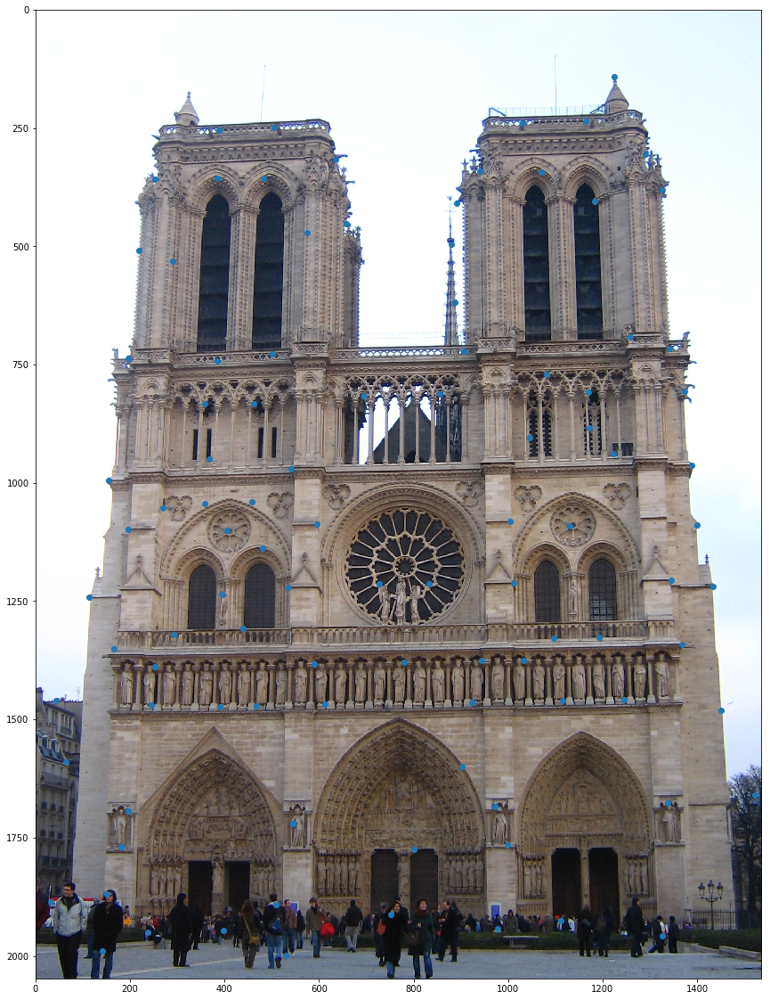

In [19]:
OptPts = %time ANMS(CornerResponse, CornerPts, 100)
fig = figure(figsize=(35, 20))
ax = fig.subplots(1, 1)

ax.imshow(NotreDame['Im1'])
ax.scatter(OptPts[:, 1], OptPts[:, 0])

In [ ]:
def ScaleInvariantHarrisCornersResponse(Image):
    SigmaBegin = 1.5
    SigmaStep = 1.2
    SigmaN = 13
    SigmaRange = np.power(SigmaStep, np.arange(SigmaN)) * SigmaBegin
    
HarrisCornersResponse(NotreDame['Im1'], GaussianDerivative(1, 1), 3)
    